# GSE172114 RNA-seq Analysis

## Analysis summary

Current pipeline uses:
- SRA Tools and entrez-direct - to get raw FASTQ files from NCBI >
- FastQC/MultiQC - for quality control >
- trimmomatic - for adapter trimming and excluding incomplete reads >
- STAR - for building index and alignment to GENCODE v23 reference >
- featureCounts - to quantify the reads >
- pyDESEQ2 - for Differential expression >
- pyGSEA - for Gene Set Enrichment Analysis >
- pyWGCNA - for Weighted Gene Network Correlation Analysis >
- seq2HLA - for HLA-II genes typing >
- Kassandra - for Deconvolution analysis 
(for deconvolution analysis transcript abundances were calculated using Kallisto with a custom Toil/Xena project index file)

All the tools were chosen based on their high popularity and cited peer reviewed publications, giving the preference to python tools.

The pipeline was mostly run on a SLURM HPC via interactive shell to make it more transferrable to non-HPC machines.
(SLURM instructions may be found in cluster_setup_listing.sh in root folder)

Snakemake workflow manager was used to facilitate the robustness of the pipeline.

FASTQ files were downloaded from SRA repository by using a custom script
    get_raw_data.sh

This script is located in snakemake/shellScripts folder and requires SRA-Tools (was loaded via SLURM module manager: module load SRA-Toolkit), entrez-direct and parallel (were installed into conda environment).

get_raw_data.sh prompts user to enter GSE accession. After that the script converts GSE to SRR accessions, downloads SRA files, converts them to FASTQ and moves to an appropriate directory for further analysis.

Once the raw data are downloaded, the rest of the pipeline can be launched from snakemake folder by using
    snakemake -j <jobs> -c <cores> command

The pipeline was run on a 192 CPU 512GB partition of the HPC.

Quality control or raw data and other steps (with MultiQC) indicated reasonable data quality. The html reports can be found in corresponding folders depending on the tool.

The downstream analysis (in the 'downstream_analysis' directory) was mainly performed on a Jupyter Lab instance of the HPC with 8 CPU and 128GB memory.

Analysis was performed using conda or virtualenv environment. Specifications of the environment are in spec-file.txt in the 'downstream_analysis' directory.

## Dataset Configuration

In [1]:
import pickle as pkl

# True to import results of DESeq2 statistical analysis from pickle object

IMPORT_PICKLES = False
CREATE_METAFILE = False

In [2]:
# Some useful objects like statistical analysis results are saved to pickle objects
# and can be loaded without re-execution

if IMPORT_PICKLES:
    deseq2_stats_file = open('deseq2_output/shrunk_stat_results_detailed_pipe.pkl', 'rb')
    stat_res = pkl.load(deseq2_stats_file)
    deseq2_stats_file.close()

In [ ]:
stat_res.results_df.shape

In [17]:
# Counfigure featureCounts output directory, GSE accession and genome assembly for annotation and metadata
FEATURE_COUNTS_DIR = "snakemake/featureCounts"
SEQ2HLA_DIR = "snakemake/hla_typing"
GSE_ACCESSION = 'GSE172114'
SPECIES = 'human'
GENCODE_RELEASE = 29
DOWNLOAD_ANNOTATION = False
# Save LFC into object
SAVE = True

# LFC output path
OUTPUT_PATH_DESEQ2 = "deseq2_output/"
OUTPUT_PATH_WGCNA = "wgcna_output/"
OUTPUT_PATH_SEQ2HLA= "seq2hla_output/"

WORKING_DIR = "/wrk-vakka/users/nikiarte/rnaseq_analysis"

In [19]:
!cd {WORKING_DIR}

## Loading libraries and annotation

In [10]:
import os
import glob
import pandas as pd
import seaborn as sns
from functools import reduce
import numpy as np
import PyWGCNA

from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
from pydeseq2.utils import load_example_data

import matplotlib.pyplot as plt

from IPython.display import Image
from core.mixer import Mixer
from core.cell_types import CellTypes
from core.model import DeconvolutionModel
from core.plotting import print_cell_matras, cells_p, print_all_cells_in_one
from core.utils import *

In [ ]:
if DOWNLOAD_ANNOTATION:
    !wget https://ftp.ebi.ac.uk/pub/databases/gencode/Gencode_{SPECIES}/release_{GENCODE_RELEASE}/gencode.v{GENCODE_RELEASE}.annotation.gtf.gz
    !gunzip gencode.v29.annotation.gtf.gz

In [ ]:
# Create output path for analysis if want to save results
if SAVE:
    OUTPUT_PATH = "deseq2_output/"
    os.makedirs(OUTPUT_PATH, exist_ok=True)

## Functions

In [ ]:
# At first I actually moved the counts files from featureCounts directory to downstream_analysis/data/counts and worked with them there. I now think it was a better idea

In [31]:
def import_featureCounts(featureCounts_dir):
    # A function to read featureCounts output files and convert them into a data frame
    # Remove the program call from the first lines
    counts_list = []
    counts_path = os.path.join(WORKING_DIR, featureCounts_dir, "*.txt")
    #count_file_list = glob.glob(featureCounts_dir + "/*.txt")
    count_file_list = glob.glob(counts_path)
    print(counts_path)
    print(featureCounts_dir + "/*.txt")
    print(count_file_list)
    for count_file in count_file_list:
#       with open(count_file, "r+") as file:
#           lines = file.readlines()
#           print("Length " + str(len(lines)))
#            if not ("Geneid" in lines[0]):
#                print("Removing first line...")
#                del lines[0]
#                print(len(lines))
#                file.seek(0)
#                for i in lines:
#                    file.write(i)
#                file.truncate()
        raw_df = pd.read_csv(count_file, sep="\t", comment='#')
        accession = count_file.split("/")[-1][:-4]
        print("Reading " + accession)
        
        counts_list.append(pd.DataFrame(
            {'gene_id': raw_df.Geneid,
             accession: raw_df["mapped/" + accession + "Aligned.sortedByCoord.out.bam"]}
        )
                        )
    counts_df = reduce(lambda df1, df2: pd.merge(df1, df2, on="gene_id", how="left"), counts_list)
    print("----")
    print("Read " + str(len(count_file_list)) + " featureCounts files")
    return counts_df
    
# test_df = pd.read_csv("data/counts/SRR14240731.txt", sep="\t")

In [5]:
def gene_info(x):
    # A function to parse genome annotation file attribute field
    gene_name = x.split("gene_name ")[1].split(";")[0][1:-1]
    gene_ensg = x.split("gene_id ")[1].split(";")[0][1:-1]
    gene_type = x.split("gene_type ")[1].split(";")[0][1:-1]
    return (gene_name, gene_ensg, gene_type)

In [6]:
def rm_versions(x):
    # A function to remove Ensembl gene id versions
    x = x.split(".")[0]
    return x

In [7]:
def import_seq2hla(seq2hla_out_dir):
    # A function to load HLA-II typing results to a dataframe
    hla_files_path = os.path.join(WORKING_DIR, seq2hla_out_dir)
    hla_files_2digits = glob.glob(hla_files_path + "/*ClassII.HLAgenotype2digits")
    hla_files_4digits = glob.glob(hla_files_path + "/*ClassII.HLAgenotype4digits")
    df_list = []
    for short_geno, long_geno in zip(hla_files_2digits, hla_files_4digits):
        path_short_geno = os.path.join(hla_files_path, short_geno)
        path_long_geno = os.path.join(hla_files_path, long_geno)
        accession = short_geno.split("/")[7].split("-")[0]
        df_short = pd.read_csv(path_short_geno, sep="\t")
        df_short["precision"] = ["2digits" for i in range(0, len(df_short.index))]
        df_short["accession"] = [accession for i in range(0, len(df_short.index))]
        df_long = pd.read_csv(path_long_geno, sep="\t")
        df_long["precision"] = ["4digits" for i in range(0, len(df_short.index))]
        df_long["accession"] = [accession for i in range(0, len(df_short.index))]
        accession_df = pd.concat([df_short, df_long])
        df_list.append(accession_df)
    full_hla_df = pd.concat(df_list, ignore_index=True)
    full_hla_df.rename({"#Locus": "Locus"}, axis='columns', inplace=True)
    return full_hla_df 

In [8]:
def import_kallisto(kallisto_out_dir):
    # A function to load Kallisto pseudoalignment results to a dataframe for deconvolution analysis
    accession_dirs_path = os.path.join(WORKING_DIR, kallisto_out_dir)
    accession_dirs = glob.glob(accession_dirs_path + "/SRR*")
    counts_list = []
    for accession in accession_dirs:
        abundance_path = os.path.join(WORKING_DIR, kallisto_out_dir, accession, "abundance.tsv")
        accession_code = accession.split("kallisto_abundance")[1][1:]
        print(f'Reading {accession_code}')
        abundance = pd.read_csv(abundance_path, sep='\t', index_col=0)
        counts = pd.DataFrame(abundance["tpm"])
        counts.rename({"tpm": accession_code}, axis='columns', inplace=True)
        counts_list.append(counts)
    full_counts_df = pd.concat(counts_list, axis='columns')
    print("-------")
    print(f'Read {len(counts_list)} files')
    return full_counts_df

## Read featureCounts data

In [32]:
# Also make sure the tables are of the same length
counts_df_full = import_featureCounts(FEATURE_COUNTS_DIR)

/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/*.txt
snakemake/featureCounts/*.txt
['/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240791.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240740.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240796.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240747.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240735.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240798.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240749.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240732.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240772.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snakemake/featureCounts/SRR14240775.txt', '/wrk-vakka/users/nikiarte/rnaseq_analysis/snak

## Read annotation

In [ ]:
annotation = pd.read_table("gencode.v29.annotation.gtf", comment="#",
                        sep = "\t", names = ['seqname', 'source', 'feature', 'start' , 'end', 'score', 'strand', 'frame', 'attribute'])
annotation_genes = annotation[(
    annotation.feature == "gene")][['seqname', 'start', 'end', 'attribute']].copy().reset_index().drop('index', axis=1)



In [22]:
annotation_genes

,seqname,start,end,attribute
0,chr1,11869,14409,"gene_id ""ENSG00000223972.5""; gene_type ""transc..."
1,chr1,14404,29570,"gene_id ""ENSG00000227232.5""; gene_type ""unproc..."
2,chr1,17369,17436,"gene_id ""ENSG00000278267.1""; gene_type ""miRNA""..."
3,chr1,29554,31109,"gene_id ""ENSG00000243485.5""; gene_type ""lincRN..."
4,chr1,30366,30503,"gene_id ""ENSG00000284332.1""; gene_type ""miRNA""..."
...,...,...,...,...
58716,chrM,14149,14673,"gene_id ""ENSG00000198695.2""; gene_type ""protei..."
58717,chrM,14674,14742,"gene_id ""ENSG00000210194.1""; gene_type ""Mt_tRN..."
58718,chrM,14747,15887,"gene_id ""ENSG00000198727.2""; gene_type ""protei..."
58719,chrM,15888,15953,"gene_id ""ENSG00000210195.2""; gene_type ""Mt_tRN..."


In [23]:
# Parsing the 'attribute' field in the annotation file
annotation_genes["gene_name"], annotation_genes["gene_id"], annotation_genes["gene_type"] = zip(*annotation_genes.attribute.apply(lambda x: gene_info(x)))
annotation_genes

,seqname,start,end,attribute,gene_name,gene_id,gene_type
0,chr1,11869,14409,"gene_id ""ENSG00000223972.5""; gene_type ""transc...",DDX11L1,ENSG00000223972.5,transcribed_unprocessed_pseudogene
1,chr1,14404,29570,"gene_id ""ENSG00000227232.5""; gene_type ""unproc...",WASH7P,ENSG00000227232.5,unprocessed_pseudogene
2,chr1,17369,17436,"gene_id ""ENSG00000278267.1""; gene_type ""miRNA""...",MIR6859-1,ENSG00000278267.1,miRNA
3,chr1,29554,31109,"gene_id ""ENSG00000243485.5""; gene_type ""lincRN...",MIR1302-2HG,ENSG00000243485.5,lincRNA
4,chr1,30366,30503,"gene_id ""ENSG00000284332.1""; gene_type ""miRNA""...",MIR1302-2,ENSG00000284332.1,miRNA
...,...,...,...,...,...,...,...
58716,chrM,14149,14673,"gene_id ""ENSG00000198695.2""; gene_type ""protei...",MT-ND6,ENSG00000198695.2,protein_coding
58717,chrM,14674,14742,"gene_id ""ENSG00000210194.1""; gene_type ""Mt_tRN...",MT-TE,ENSG00000210194.1,Mt_tRNA
58718,chrM,14747,15887,"gene_id ""ENSG00000198727.2""; gene_type ""protei...",MT-CYB,ENSG00000198727.2,protein_coding
58719,chrM,15888,15953,"gene_id ""ENSG00000210195.2""; gene_type ""Mt_tRN...",MT-TT,ENSG00000210195.2,Mt_tRNA


In [24]:
# annotation_genes_name_id = annotation_genes[annotation_genes.gene_type == "protein_coding"]
annotation_genes_name_id = pd.DataFrame().assign(gene_id=annotation_genes["gene_id"],
                                                 gene_name=annotation_genes["gene_name"])

In [25]:
annotation_genes_name_id

,gene_id,gene_name
0,ENSG00000223972.5,DDX11L1
1,ENSG00000227232.5,WASH7P
2,ENSG00000278267.1,MIR6859-1
3,ENSG00000243485.5,MIR1302-2HG
4,ENSG00000284332.1,MIR1302-2
...,...,...
58716,ENSG00000198695.2,MT-ND6
58717,ENSG00000210194.1,MT-TE
58718,ENSG00000198727.2,MT-CYB
58719,ENSG00000210195.2,MT-TT


In [26]:
# Adding annotations to the counts table
counts_df = pd.merge(annotation_genes_name_id, counts_df_full, on="gene_id", how="left")

### Prepare counts matrix for DESeq2

In [27]:
counts_df = counts_df_full

counts_df = counts_df.T
header_row = counts_df.iloc[0]
counts_df = counts_df[1:]
counts_df.columns = header_row
counts_df.sort_index(inplace=True)
# Chose threshold of 30 reads total among samples, because a lot of samples
keep = counts_df.columns[counts_df.sum(axis=0) >= 30]
counts_df = counts_df[keep]

In [28]:
counts_df.head()

gene_id,ENSG00000223972.5,ENSG00000227232.5,ENSG00000278267.1,ENSG00000238009.6,ENSG00000239945.1,ENSG00000233750.3,ENSG00000268903.1,ENSG00000269981.1,ENSG00000239906.1,ENSG00000241860.6,...,ENSG00000198886.2,ENSG00000210176.1,ENSG00000210184.1,ENSG00000210191.1,ENSG00000198786.2,ENSG00000198695.2,ENSG00000210194.1,ENSG00000198727.2,ENSG00000210195.2,ENSG00000210196.2
SRR14240730,0,29,25,40,4,4,19,3,9,65,...,659,36,36,7,340,32,7,646,83,61
SRR14240731,8,136,33,39,4,5,30,3,2,96,...,1424,11,12,17,480,354,127,1446,41,58
SRR14240732,0,66,35,13,0,0,16,0,4,42,...,910,52,56,10,212,36,18,554,141,106
SRR14240733,2,33,6,36,0,4,48,2,12,134,...,772,2,2,7,272,10,2,650,97,100
SRR14240734,2,37,20,205,3,2,79,2,25,286,...,358,12,14,4,166,50,15,250,84,94


## Creating metadata file

In [29]:
# Get the bioproject study accession to query metadata file from SRA to read metafile from NCBI
PYSRADB_PATH = "/wrk-vakka/users/nikiarte/rnaseq_analysis/deconvolution/kassandra-env/bin/pysradb gse-to-srp"
if CREATE_METAFILE:
    !{PYSRADB_PATH} {GSE_ACCESSION} > srp.txt
    srp = pd.read_csv("srp.txt", sep="\t")
    SRP_ACCESSION = srp.study_accession[0]
    print("Study accession is " + srp.study_accession[0])
    !rm srp.txt

In [30]:
if CREATE_METAFILE:
    # Query metadata table by project number
    !/wrk-vakka/users/nikiarte/rnaseq_analysis/deconvolution/kassandra-env/bin/pysradb gse-to-srp metadata {SRP_ACCESSION} --detailed > sample_metadata.txt

In [31]:
metadata_raw = pd.read_csv("sample_metadata.txt", sep="\t")

In [32]:
metadata = pd.DataFrame().assign(
    run_accession=metadata_raw["run_accession"],
    disease_state=metadata_raw["disease state"]
)

In [33]:
metadata.set_index('run_accession', inplace=True)
metadata.sort_index(inplace=True)
metadata

,disease_state
run_accession,
SRR14240730,Non-critical
SRR14240731,Non-critical
SRR14240732,Non-critical
SRR14240733,Non-critical
SRR14240734,Non-critical
...,...
SRR14240794,Critical
SRR14240795,Critical
SRR14240796,Critical


## pyDESeq2 Analysis

In [34]:
inference = DefaultInference(n_cpus=8)
dds = DeseqDataSet(
    counts=counts_df,
    metadata=metadata,
    design_factors="disease_state",
    refit_cooks=True,
    inference=inference,
)

In [36]:
import scanpy as sc

# Famous scRNA-seq tool, but also works easily with anndata objects and has a handy PCA function

In [37]:
sc.tl.pca(dds)

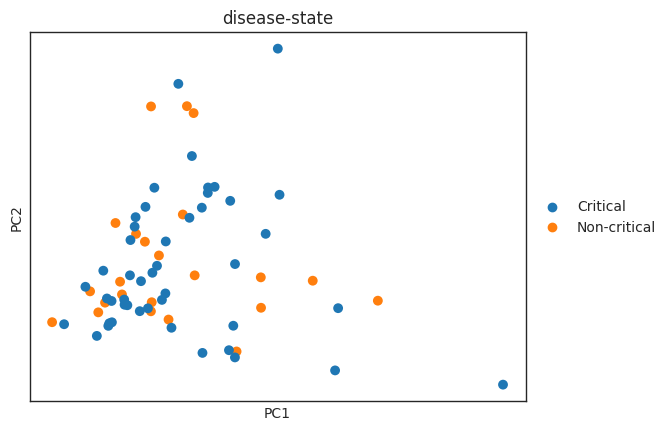

In [38]:
# PCA shows that samples do not really cluster by conditon
# We are not aware of batch effects, so will proceed
# In the original publication several omics datasets are used
# which may improve statistical power to differennnntiate between groups

sc.pl.pca(dds, color = 'disease-state', size = 200)

### Compute normalization factors

In [39]:
# Standard DeSEQ2 pipeline for single factor design

dds.fit_size_factors()

dds.obsm["size_factors"]

Fitting size factors...
... done in 0.29 seconds.



array([0.97885004, 1.58475074, 1.25865234, 0.95538811, 1.46642722,
       1.99529512, 1.42544942, 1.23654373, 1.52736254, 1.27424372,
       1.35482537, 1.32682361, 0.61756656, 0.68285452, 1.52225326,
       1.11358153, 1.41180852, 1.09889709, 1.19608667, 1.49847807,
       1.11699171, 1.02212802, 0.97141166, 1.21979302, 0.64762543,
       1.0393437 , 0.48061295, 0.85602963, 0.74829868, 0.56092712,
       1.35335225, 0.74657287, 1.44965289, 0.91380375, 1.07373772,
       1.38140585, 1.00501727, 0.98740889, 0.56582328, 1.24976368,
       1.18572123, 0.90608317, 0.77054981, 1.09808231, 0.33102054,
       1.39694373, 1.00058698, 0.74610031, 1.13295257, 1.22452738,
       1.44764246, 0.81132708, 0.82600742, 0.56236355, 1.36310522,
       0.54354166, 1.10046565, 1.14971395, 0.65418302, 0.78145935,
       0.85449492, 0.97968847, 0.75145644, 2.44813425, 0.46601431,
       0.8935974 , 1.04068207, 1.79057492, 0.9747499 ])

### Fit genewise dispersions

In [40]:
%%capture --no-display
dds.fit_genewise_dispersions()

dds.varm["genewise_dispersions"];

array([3.84794557, 0.16287869, 0.19012269, ..., 0.59872449, 0.93677759,
       0.39554558])

In [41]:
dds.fit_dispersion_trend()
dds.uns["trend_coeffs"]
dds.varm["fitted_dispersions"]

Fitting dispersion trend curve...
... done in 1.57 seconds.



array([2.90322807, 0.27716463, 0.44855578, ..., 0.1873075 , 0.23267123,
       0.26097705])

In [42]:
dds.fit_dispersion_prior()
print(
    f"logres_prior={dds.uns['_squared_logres']}, sigma_prior={dds.uns['prior_disp_var']}"
)

logres_prior=0.463265467423237, sigma_prior=0.4329647552483135


In [43]:
dds.fit_MAP_dispersions()
dds.varm["MAP_dispersions"]
dds.varm["dispersions"]

Fitting MAP dispersions...
... done in 23.22 seconds.



array([3.70337775, 0.16939018, 0.20772612, ..., 0.5626372 , 0.93677759,
       0.38577015])

In [44]:
dds.fit_LFC()
dds.varm["LFC"]

Fitting LFCs...
... done in 13.29 seconds.



,intercept,disease-state_Non-critical_vs_Critical
gene_id,,
ENSG00000223972.5,0.659151,0.529218
ENSG00000227232.5,4.244964,-0.138108
ENSG00000278267.1,3.203972,-0.070461
ENSG00000238009.6,5.138435,-1.130711
ENSG00000239945.1,2.788489,-1.646235
...,...,...
ENSG00000198695.2,4.635584,-0.570752
ENSG00000210194.1,3.665197,-0.560093
ENSG00000198727.2,6.841759,-0.457064


In [45]:
dds.calculate_cooks()
if dds.refit_cooks:
    # Replace outlier counts
    dds.refit()

Calculating cook's distance...
... done in 0.61 seconds.

Replacing 473 outlier genes.

Fitting dispersions...
... done in 0.45 seconds.

Fitting MAP dispersions...
... done in 0.34 seconds.

Fitting LFCs...
... done in 0.25 seconds.



In [46]:
if SAVE:
    with open(os.path.join(OUTPUT_PATH_DESEQ2, "dds_detailed_pipe.pkl"), "wb") as f:
        pkl.dump(dds, f)

### Statistical analysis

In [47]:
stat_res = DeseqStats(dds, alpha=0.05, cooks_filter=True, independent_filter=True)

In [48]:
stat_res.run_wald_test()
stat_res.p_values

Running Wald tests...
... done in 42.22 seconds.



gene_id
ENSG00000223972.5    3.045290e-01
ENSG00000227232.5    2.077078e-01
ENSG00000278267.1    5.793250e-01
ENSG00000238009.6    6.830500e-10
ENSG00000239945.1    3.364430e-05
                         ...     
ENSG00000198695.2    8.932406e-03
ENSG00000210194.1    2.201071e-02
ENSG00000198727.2    1.716596e-02
ENSG00000210195.2    8.664927e-03
ENSG00000210196.2    3.691344e-03
Length: 40588, dtype: float64

In [49]:
if stat_res.cooks_filter:
    stat_res._cooks_filtering()
stat_res.p_values

gene_id
ENSG00000223972.5    3.045290e-01
ENSG00000227232.5    2.077078e-01
ENSG00000278267.1    5.793250e-01
ENSG00000238009.6    6.830500e-10
ENSG00000239945.1    3.364430e-05
                         ...     
ENSG00000198695.2    8.932406e-03
ENSG00000210194.1    2.201071e-02
ENSG00000198727.2    1.716596e-02
ENSG00000210195.2    8.664927e-03
ENSG00000210196.2    3.691344e-03
Length: 40588, dtype: float64

In [50]:
if stat_res.independent_filter:
    stat_res._independent_filtering()
else:
    stat_res._p_value_adjustment()

stat_res.padj

gene_id
ENSG00000223972.5    4.426230e-01
ENSG00000227232.5    3.347449e-01
ENSG00000278267.1    6.979957e-01
ENSG00000238009.6    2.944495e-08
ENSG00000239945.1    2.682934e-04
                         ...     
ENSG00000198695.2    2.907094e-02
ENSG00000210194.1    6.004905e-02
ENSG00000198727.2    4.930239e-02
ENSG00000210195.2    2.835987e-02
ENSG00000210196.2    1.406511e-02
Name: 10, Length: 40588, dtype: float64

In [51]:
stat_res.summary()

Log2 fold change & Wald test p-value: disease-state Non-critical vs Critical
                     baseMean  log2FoldChange     lfcSE      stat  \
gene_id                                                             
ENSG00000223972.5    2.396442        0.763501  0.743595  1.026769   
ENSG00000227232.5   66.742697       -0.199247  0.158146 -1.259894   
ENSG00000278267.1   24.248684       -0.101653  0.183367 -0.554371   
ENSG00000238009.6  131.982353       -1.631271  0.264389 -6.169965   
ENSG00000239945.1   11.902295       -2.375015  0.572668 -4.147284   
...                       ...             ...       ...       ...   
ENSG00000198695.2   88.155395       -0.823421  0.314928 -2.614630   
ENSG00000210194.1   33.513697       -0.808043  0.352829 -2.290183   
ENSG00000198727.2  821.586433       -0.659404  0.276696 -2.383134   
ENSG00000210195.2  122.448462       -0.941150  0.358534 -2.624999   
ENSG00000210196.2   79.980552       -0.676542  0.233017 -2.903400   

                         

In [52]:
if SAVE:
    with open(os.path.join(OUTPUT_PATH_DESEQ2, "stat_results_detailed_pipe.pkl"), "wb") as f:
        pkl.dump(stat_res, f)

Running Wald tests...
... done in 11.29 seconds.



Log2 fold change & Wald test p-value: disease-state Non-critical vs Critical
                     baseMean  log2FoldChange     lfcSE      stat  \
gene_id                                                             
ENSG00000223972.5    2.396442        0.763501  0.743595  0.892288   
ENSG00000227232.5   66.742697       -0.199247  0.158146 -0.627567   
ENSG00000278267.1   24.248684       -0.101653  0.183367 -0.009016   
ENSG00000238009.6  131.982353       -1.631271  0.264389 -5.791735   
ENSG00000239945.1   11.902295       -2.375015  0.572668 -3.972662   
...                       ...             ...       ...       ...   
ENSG00000198695.2   88.155395       -0.823421  0.314928 -2.297098   
ENSG00000210194.1   33.513697       -0.808043  0.352829 -2.006760   
ENSG00000198727.2  821.586433       -0.659404  0.276696 -2.021726   
ENSG00000210195.2  122.448462       -0.941150  0.358534 -2.346085   
ENSG00000210196.2   79.980552       -0.676542  0.233017 -2.474248   

                         

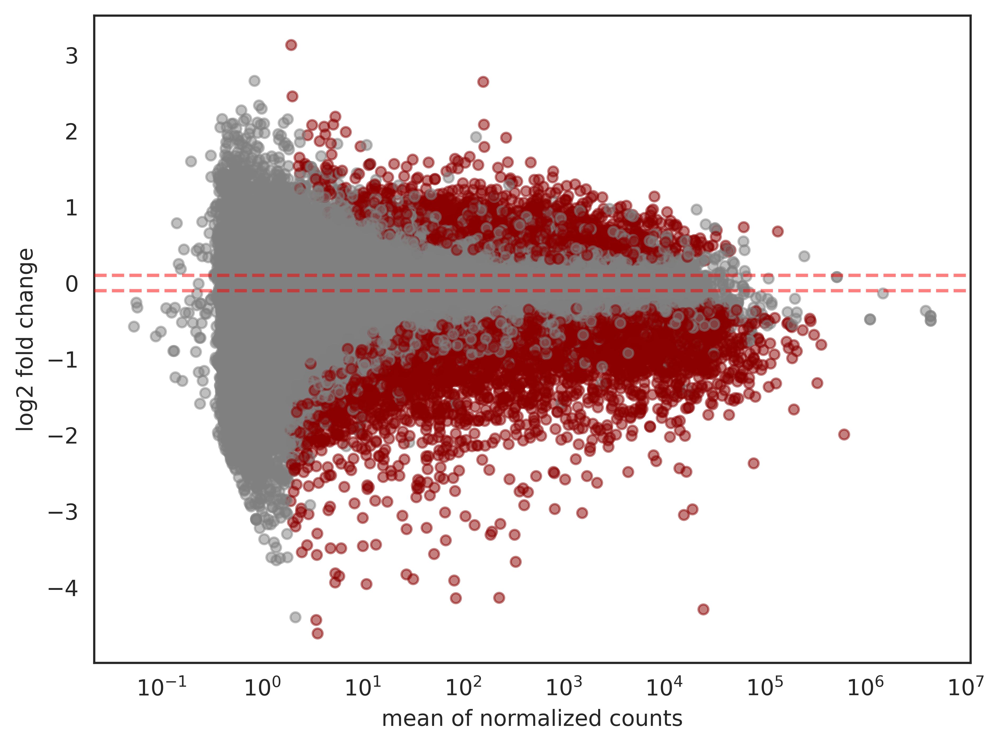

In [53]:
stat_res.summary(lfc_null=0.1, alt_hypothesis="greaterAbs")
stat_res.plot_MA(s=20)

In [54]:
stat_res.lfc_shrink(coeff="disease-state_Non-critical_vs_Critical")

Fitting MAP LFCs...


Shrunk log2 fold change & Wald test p-value: disease-state Non-critical vs Critical
                     baseMean  log2FoldChange     lfcSE      stat  \
gene_id                                                             
ENSG00000223972.5    2.396442        0.145308  0.417477  0.892288   
ENSG00000227232.5   66.742697       -0.166425  0.151065 -0.627567   
ENSG00000278267.1   24.248684       -0.078290  0.169463 -0.009016   
ENSG00000238009.6  131.982353       -1.548087  0.271162 -5.791735   
ENSG00000239945.1   11.902295       -2.061267  0.626129 -3.972662   
...                       ...             ...       ...       ...   
ENSG00000198695.2   88.155395       -0.616840  0.333050 -2.297098   
ENSG00000210194.1   33.513697       -0.540152  0.372761 -2.006760   
ENSG00000198727.2  821.586433       -0.488423  0.283126 -2.021726   
ENSG00000210195.2  122.448462       -0.678406  0.389832 -2.346085   
ENSG00000210196.2   79.980552       -0.559321  0.238892 -2.474248   

                  

... done in 21.04 seconds.



In [55]:
if SAVE:
    with open(
        os.path.join(OUTPUT_PATH_DESEQ2, "shrunk_stat_results_detailed_pipe.pkl"), "wb"
    ) as f:
        pkl.dump(stat_res, f)

In [56]:
res = stat_res.results_df


In [57]:
stat_res.results_df.shape

(40588, 6)

### Visualization

In [58]:
from sanbomics.plots import volcano

# Very good toolbox package

In [59]:
# Filter by baseMean at this point to remove lowly expressed genes
# Although debatable, many people use most genes for model building
res = res[res.baseMean >= 10]
#res = res[res.padj <= 0.2]

# around 20K is a fair number of genes, especially if there are several cell types
res.shape

(23381, 6)

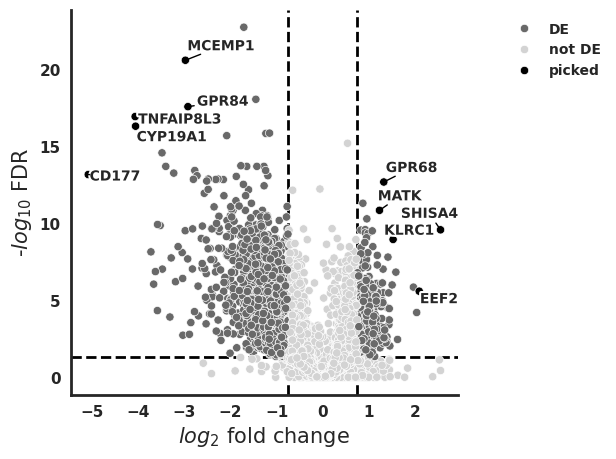

In [60]:
res = pd.merge(res, annotation_genes_name_id, on="gene_id", how="left")
res.rename(columns={"gene_name": "Symbol"}, inplace=True)
volcano(res, symbol="Symbol",log2fc="log2FoldChange")

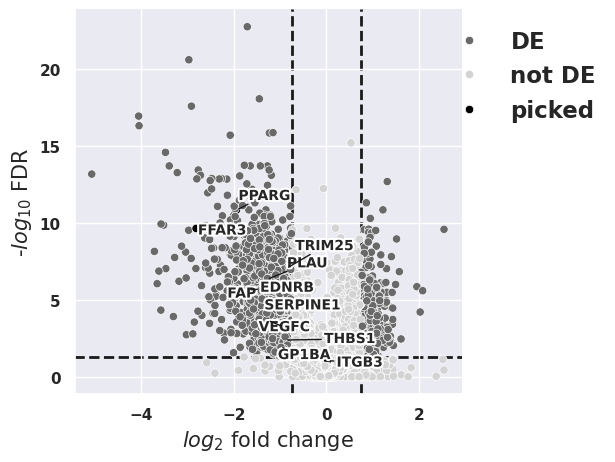

In [278]:
# Some genes from the article. Look very similar (the direction is inversed because I inferred
# Non-critical vs Critical. Non-critical is on the right side, critical - on the left)
volcano(res, symbol="Symbol",log2fc="log2FoldChange",to_label=['PPARG', 'TRIM25', 'PLAU', 'FFAR3', 'SERPINE1', 'VEGFC', 'FAP','ITGB3', 'GP1BA', 'EDNRB', 'THBS1'])

In [61]:
dds.layers['log1p'] = np.log1p(dds.layers['normed_counts'])
sigs = res[(res.padj < 0.05) & (abs(res.log2FoldChange) > 1)]
dds_sigs = dds[:, sigs.index]

In [306]:
print("Number of differentially expressed genes")
sigs.shape

Number of differentially expressed genes


(1111, 8)

In [62]:
grapher = pd.DataFrame(dds_sigs.layers['log1p'].T,
                       index=dds_sigs.var_names, columns=dds_sigs.obs)

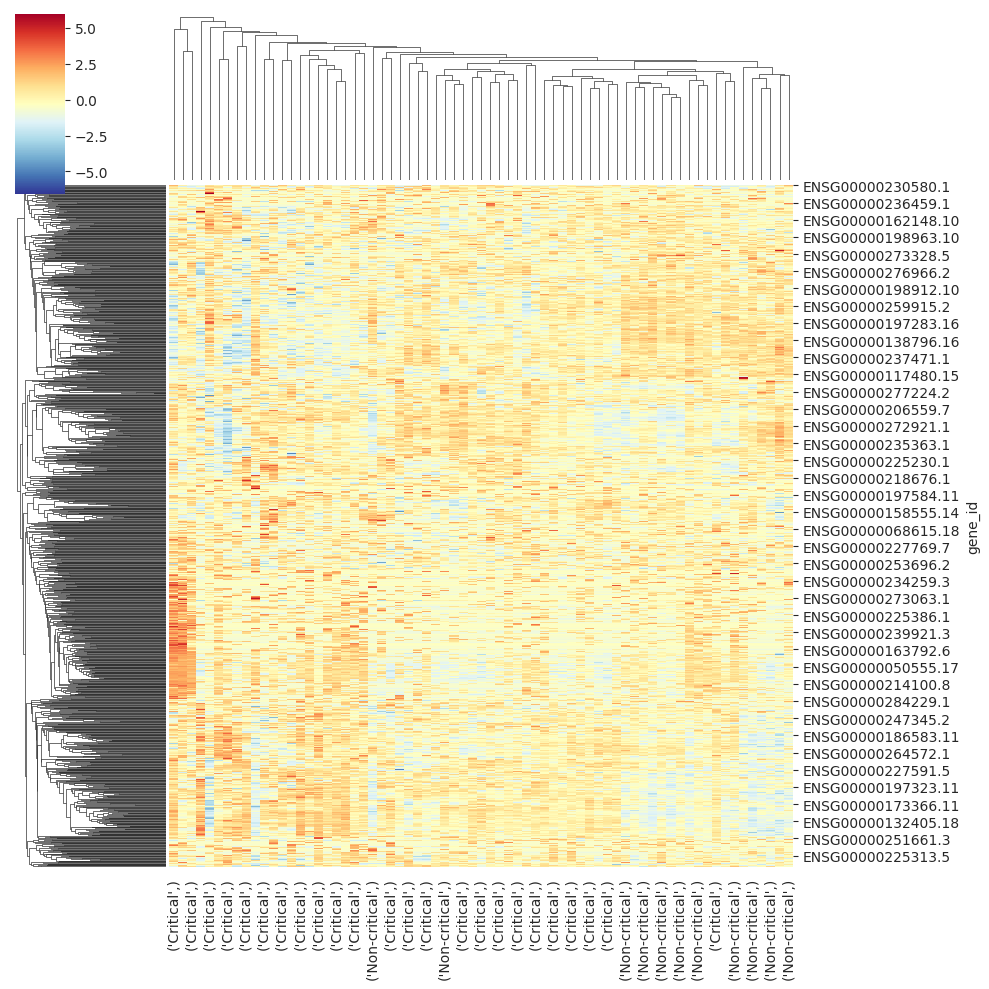

In [63]:
# Doesn't seem, like on PCA earlier, that there are any extremely striking
# differences in this dataset, there are some gene clusters though

sns.clustermap(grapher, z_score=0, cmap = 'RdYlBu_r')

## GSEA

In [64]:
import gseapy as gp
from gseapy import gseaplot

In [65]:
# Ranking for GSEA
ranking =  res[['Symbol', 'stat']].dropna().sort_values('stat', ascending = False)
ranking

,Symbol,stat
15584,GPR68,8.229975
21771,AL121845.2,7.800672
19774,MATK,7.643072
17244,SEPT1,7.443536
3897,PASK,7.171649
...,...,...
16175,TNFAIP8L3,-9.520479
13816,GPR84,-9.696618
5363,CDC42P6,-9.837057
19878,MCEMP1,-10.448000


In [66]:
# Number of duplicates is quite low
# I could also check them and apply some statistic for collapsing later,
# but kept as is for now

ranking['Symbol'] = list(ranking['Symbol'])
ranking = ranking.drop_duplicates('Symbol')
ranking.set_index("Symbol", inplace=True)
ranking

,stat
Symbol,
GPR68,8.229975
AL121845.2,7.800672
MATK,7.643072
SEPT1,7.443536
PASK,7.171649
...,...
TNFAIP8L3,-9.520479
GPR84,-9.696618
CDC42P6,-9.837057


In [ ]:
#gp.get_library_name()

In [69]:
# The warning comes from the stat value that is repeated. Doesn't seem to affect results
# strongly, because they make sense. But I would look more carefully into this

pre_res = gp.prerank(
    rnk=ranking['stat'],
    gene_sets=['GO_Biological_Process_2023',
               'GO_Cellular_Component_2023',
               'GO_Molecular_Function_2023',
               'KEGG_2021_Human',
               'BioPlanet_2019',
               'WikiPathway_2023_Human',
               'ENCODE_TF_ChIP-seq_2015',
               'BioCarta_2016',
               'MSigDB_Hallmark_2020',
               'Reactome_2022',
               'UK_Biobank_GWAS_v1',
               'GWAS_Catalog_2023'
              ],
    threads=8,
    seed=6,
    permutation_num=100
)

2024-08-06 02:22:54,883 [WARNING] Duplicated values found in preranked stats: 16.18% of genes
The order of those genes will be arbitrary, which may produce unexpected results.


In [70]:
out = []

for term in list(pre_res.results):
    out.append([term,
               pre_res.results[term]['fdr'],
               pre_res.results[term]['es'],
               pre_res.results[term]['nes']])

out_df = pd.DataFrame(out, columns = ['Term','fdr', 'es', 'nes']).sort_values('fdr').reset_index(drop = True)
out_df

,Term,fdr,es,nes
0,Reactome_2022__Formation Of A Pool Of Free 40S...,0.000000,0.627757,2.533288
1,WikiPathway_2023_Human__IL 4 Signaling Pathway...,0.000000,-0.645309,-2.061533
2,GO_Cellular_Component_2023__Cytosolic Large Ri...,0.000000,0.617194,2.289444
3,GO_Biological_Process_2023__Cytoplasmic Transl...,0.000000,0.580825,2.477489
4,GO_Cellular_Component_2023__Specific Granule (...,0.000000,-0.706551,-2.538967
...,...,...,...,...
7380,KEGG_2021_Human__Tyrosine metabolism,0.997497,-0.203913,-0.527417
7381,GO_Biological_Process_2023__Negative Regulatio...,0.997568,-0.185159,-0.529151
7382,Reactome_2022__Formation Of Tubulin Folding In...,0.998019,-0.192561,-0.517578
7383,GO_Biological_Process_2023__Gastrulation (GO:0...,0.998419,-0.212679,-0.506433


In [71]:
out_df.sort_values('nes').iloc[2].Term

'Reactome_2022__Neutrophil Degranulation R-HSA-6798695'

In [ ]:
#gseaplot(pre_res.ranking,
#         term='GO_Cellular_Component_2023__Secretory Granule Membrane (GO:0030667)',
#         **pre_res.results['GO_Cellular_Component_2023__Secretory Granule Membrane (GO:0030667)'])

In [72]:
pre_res.ranking

gene_name
GPR68          8.229975
AL121845.2     7.800672
MATK           7.643072
SEPT1          7.443536
PASK           7.171649
                ...    
TNFAIP8L3     -9.520479
GPR84         -9.696618
CDC42P6       -9.837057
MCEMP1       -10.448000
AC113404.3   -10.970264
Name: prerank, Length: 23227, dtype: float64

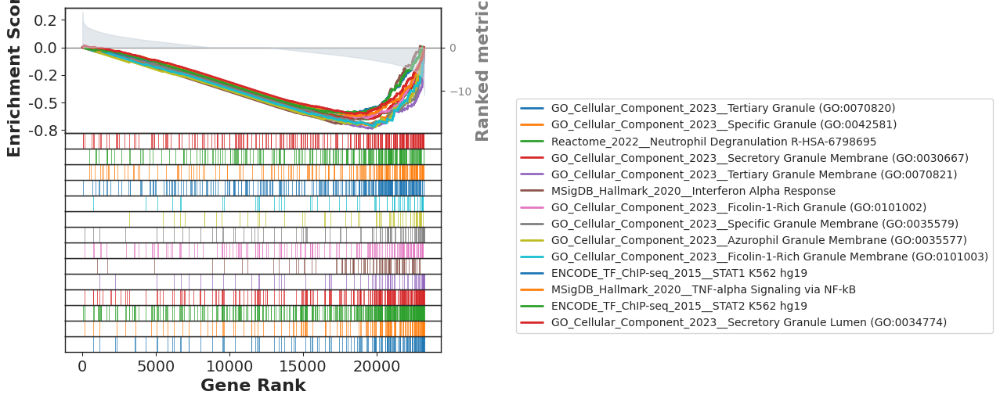

In [79]:
# Interestingly, Neutrophil Degranulation was also a top enriched pathway in the original publication
# Most likely these several inflammation terms are biologically relevant - enriched in critical patients samples

terms = out_df.sort_values('nes').Term[0:14]

axs = pre_res.plot(terms, show_ranking=True, legend_kws={'loc': (1.2, -1.6)}, )


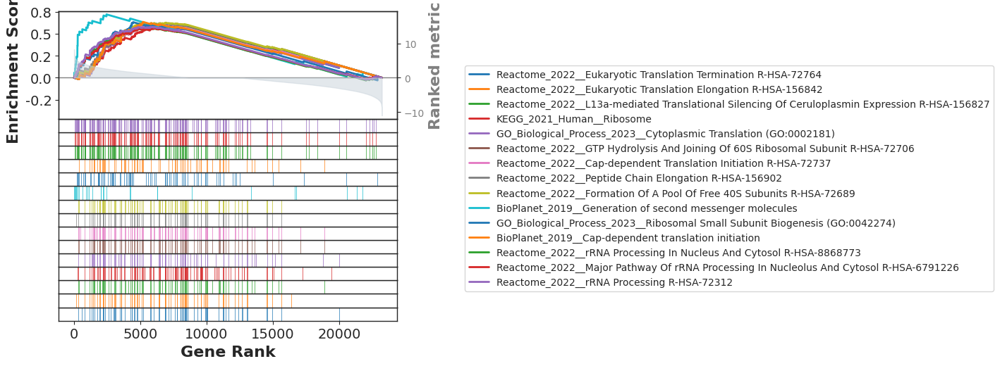

In [80]:
# These cells synthesize proteins and do more anabolic stuff, which is characteeeeeristic of healthier cells
# It's better than granulocyte degranulation - thus makes sense that these are the non-critical enrichments

terms = out_df.sort_values('nes').Term[-15:]
axs = pre_res.plot(terms, show_ranking=True, legend_kws={'loc': (1.2, -1.6)}, )

## WGCNA

In [ ]:
import PyWGCNA

In [233]:
RERUN_WGCNA=True

In [231]:
if not RERUN_WGCNA:
    wgcna_file = open('wgcna_output/wgcna_object.pkl', 'rb')
    pyWGCNA_COVID = pkl.load(wgcna_file)
    wgcna_file.close()

In [ ]:
if RERUN_WGCNA:
    pyWGCNA_COVID = PyWGCNA.WGCNA(anndata=dds)

In [ ]:
pyWGCNA_COVID.geneExpr.to_df().head(5)

In [ ]:
if RERUN_WGCNA:
    pyWGCNA_COVID.preprocess()

In [ ]:
if RERUN_WGCNA:
    pyWGCNA_COVID.findModules()

In [ ]:
SAVE=False

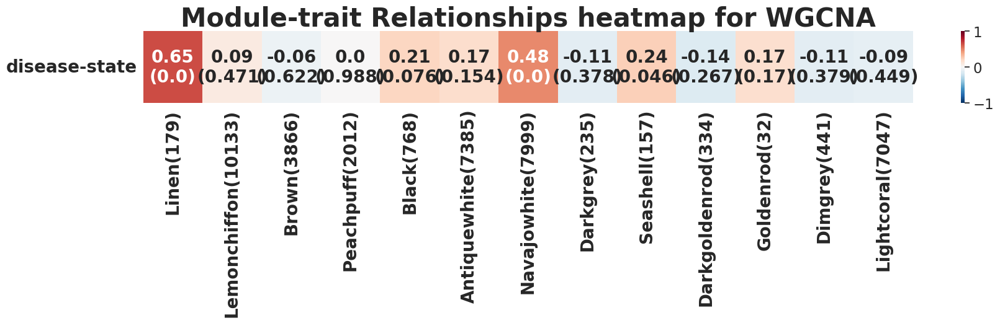

In [236]:
# A total of 13 modules found
# Linen and Navajowhite modules seem to correlate with disease state. Will check pathways for them

pyWGCNA_COVID.module_trait_relationships_heatmap(metaData=['disease-state'],
                                                 alternative='two-sided')

In [239]:
# These are some commands to fix non annotating of the dataseet
# by pyWGCNA because of the Ensembl gene versions in gene ids 

pyWGCNA_COVID.geneExpr.var.index = pd.Index(pd.Series(pyWGCNA_COVID.geneExpr.var.index).apply(lambda x: rm_versions(x)))

In [240]:
pyWGCNA_COVID.datExpr.var.index = pd.Index(pd.Series(pyWGCNA_COVID.datExpr.var.index).apply(lambda x: rm_versions(x)))

In [241]:
pyWGCNA_COVID.species=SPECIES

In [242]:
pyWGCNA_COVID.TOM.index = pd.Index(pd.Series(pyWGCNA_COVID.TOM.index).apply(lambda x: rm_versions(x)))

In [243]:
pyWGCNA_COVID.TOM.columns = pd.Index(pd.Series(pyWGCNA_COVID.TOM.columns).apply(lambda x: rm_versions(x)))

In [244]:
if RERUN_WGCNA:
    geneList = PyWGCNA.getGeneList(dataset='hsapiens_gene_ensembl',
                               attributes=['ensembl_gene_id', 
                                           'external_gene_name', 
                                           'gene_biotype'],
                               maps=['gene_id', 'gene_name', 'gene_biotype'])




In [245]:
if RERUN_WGCNA:
    pyWGCNA_COVID.updateGeneInfo(geneList)

In [246]:
MODULE="linen"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["GO_Biological_Process_2023",
                    "GO_Cellular_Component_2023",
                    "GO_Molecular_Function_2023"]
pyWGCNA_COVID.functional_enrichment_analysis(type="GO",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'GO_{MODULE}_2023')

No enrich terms when cutoff = 0.05 in module linen


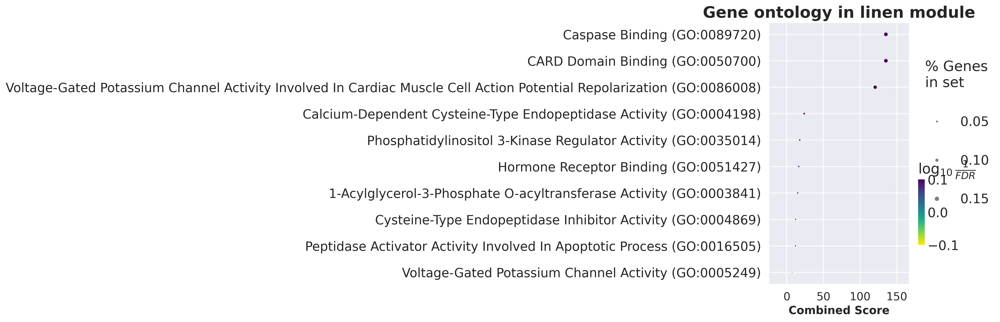

In [247]:
Image(filename=f'figures/GO/GO_{MODULE}_2023.png')

In [249]:
MODULE="brown"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["GO_Biological_Process_2023",
                    "GO_Cellular_Component_2023",
                    "GO_Molecular_Function_2023"]
pyWGCNA_COVID.functional_enrichment_analysis(type="GO",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'GO_{MODULE}_2023')

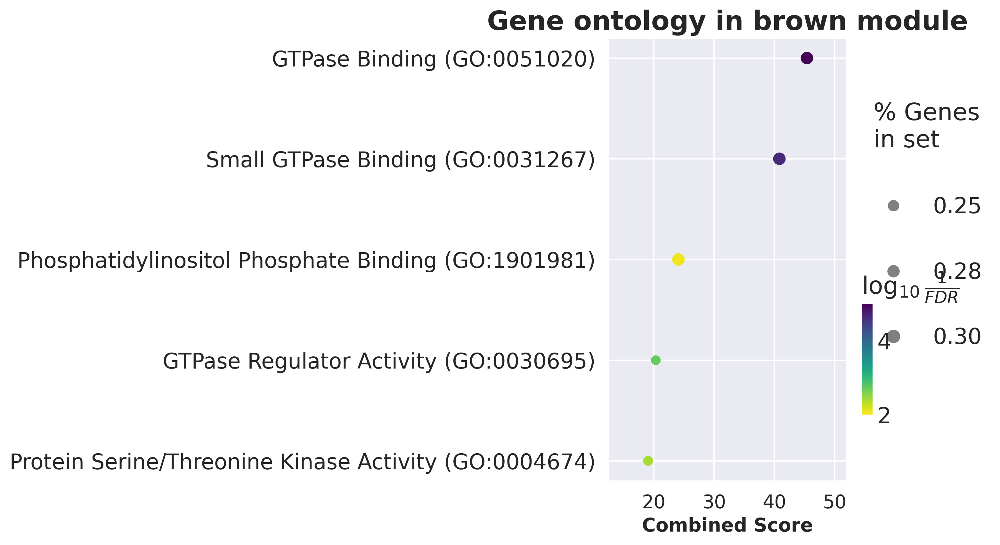

In [250]:
Image(filename=f'figures/GO/GO_{MODULE}_2023.png')

In [252]:
MODULE="navajowhite"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["GO_Biological_Process_2023",
                    "GO_Cellular_Component_2023",
                    "GO_Molecular_Function_2023"]
pyWGCNA_COVID.functional_enrichment_analysis(type="GO",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'GO_{MODULE}_2023')

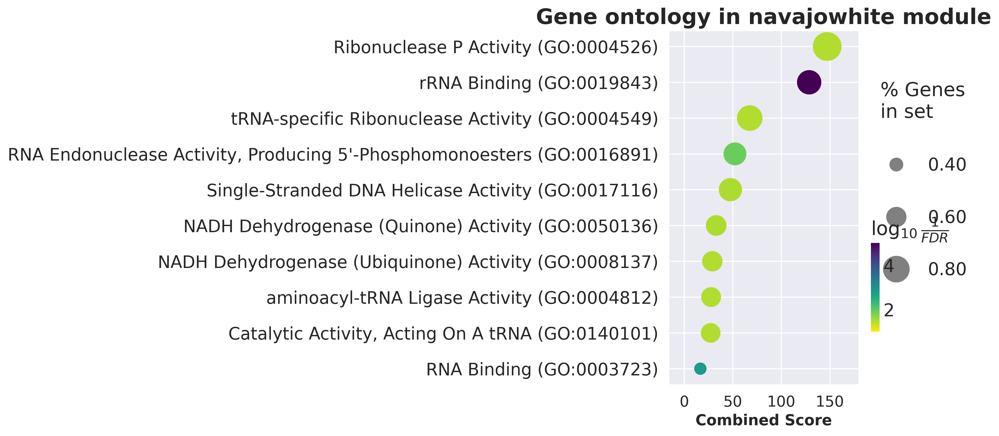

In [253]:
Image(filename=f'figures/GO/GO_{MODULE}_2023.png')

In [259]:
MODULE="linen"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["KEGG_2021_Human"]
pyWGCNA_COVID.functional_enrichment_analysis(type="KEGG",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'KEGG_{MODULE}_2021')


No enrich terms when cutoff = 0.05 in module linen


In [260]:
MODULE="brown"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["KEGG_2021_Human"]
pyWGCNA_COVID.functional_enrichment_analysis(type="KEGG",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'KEGG_{MODULE}_2021')

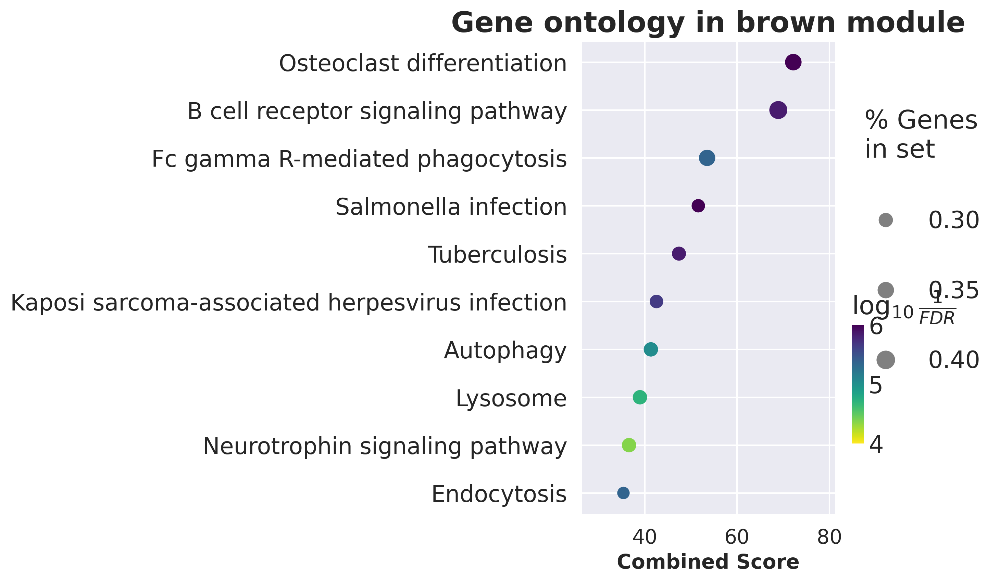

In [261]:
Image(filename=f'figures/KEGG/KEGG_{MODULE}_2021.png')

In [264]:
MODULE="navajowhite"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["KEGG_2021_Human"]
pyWGCNA_COVID.functional_enrichment_analysis(type="KEGG",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'KEGG_{MODULE}_2021')

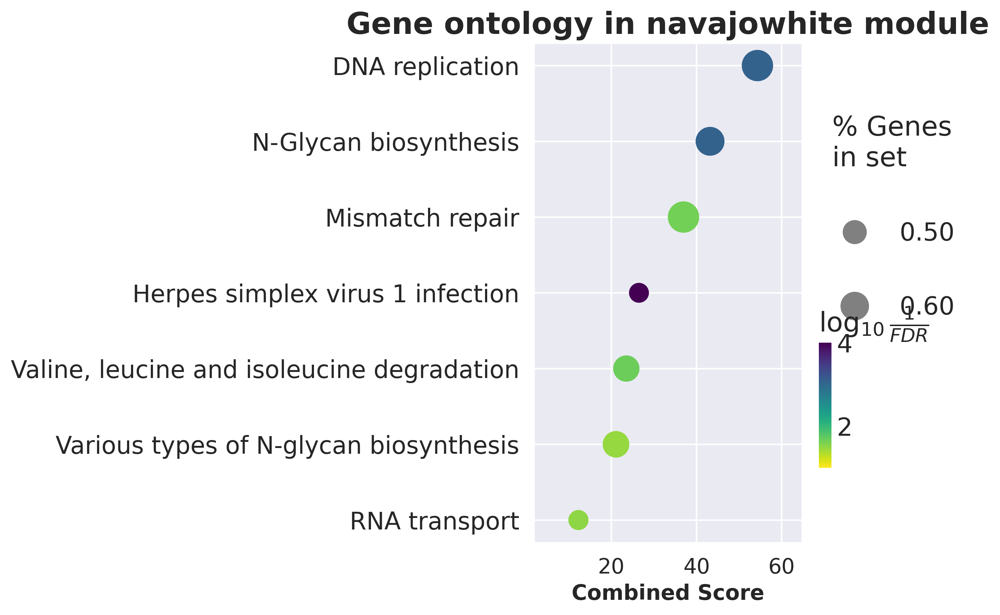

In [265]:
Image(filename=f'figures/KEGG/KEGG_{MODULE}_2021.png')

In [270]:
MODULE="seashell"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["KEGG_2021_Human"]
pyWGCNA_COVID.functional_enrichment_analysis(type="KEGG",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'KEGG_{MODULE}_2021')

No enrich terms when cutoff = 0.05 in module seashell


In [272]:
MODULE="seashell"
pyWGCNA_COVID.figureType = "png"
gene_set_library = ["GO_Biological_Process_2023",
                    "GO_Cellular_Component_2023",
                    "GO_Molecular_Function_2023"]
pyWGCNA_COVID.functional_enrichment_analysis(type="GO",
                                             moduleName=MODULE,
                                             sets=gene_set_library,
                                             p_value=0.05,
                                             file_name=f'GO_{MODULE}_2023')

No enrich terms when cutoff = 0.05 in module seashell


In [263]:
# HTML files with networks are built, but an error is still thrown

pyWGCNA_COVID.CoexpressionModulePlot(modules=["linen"], numGenes=10, numConnections=100, minTOM=0)


FileNotFoundError: [Errno 2] No such file or directory: './/wrk-vakka/users/nikiarte/rnaseq_analysis/downstream_analysis/figures/network/linen.html'

## HLA-II Typing

In [119]:
# The 2-digit typing succeeded for most samples, but predicting a 4-digit haplotype is harder
hla_haplotypes = import_seq2hla("snakemake/hla_typing")
hla_haplotypes.head(24)

,Locus,Allele 1,Confidence,Allele 2,Confidence.1,precision,accession
0,DQA1,DQA1*01,NaN,"hoz(""DQA1*01"")",NaN,2digits,SRR14240794
1,DQB1,DQB1*05,NaN,"hoz(""DQB1*02"")",NaN,2digits,SRR14240794
2,DRB1,DRB1*01,4.710501e-02,DRB1*14,0.455553,2digits,SRR14240794
3,DRA,DRA*01,NaN,"hoz(""DRA*01"")",NaN,2digits,SRR14240794
4,DPA1,DPA1*02,7.561377e-02,"hoz(""DPA1*01"")",0.039010,2digits,SRR14240794
5,DPB1,DPB1*04,2.034394e-02,DPB1*10,0.000017,2digits,SRR14240794
6,DQA1,no,NaN,no,NaN,4digits,SRR14240794
7,DQB1,no,NaN,DQB1*05:01,NaN,4digits,SRR14240794
8,DRB1,no,NaN,DRB1*13:02',0.185563,4digits,SRR14240794
9,DRA,no,NaN,no,NaN,4digits,SRR14240794


In [269]:
path = os.path.join(OUTPUT_PATH_SEQ2HLA, f'{GSE_ACCESSION}_hla2_haplotypes.csv')
hla_haplotypes.to_csv(path)

## Deconvolution

### Reading expression data

In [163]:
counts_covid_kallisto = import_kallisto("snakemake/kallisto_abundance")

Reading SRR14240772
Reading SRR14240778
Reading SRR14240796
Reading SRR14240740
Reading SRR14240737
Reading SRR14240785
Reading SRR14240761
Reading SRR14240759
Reading SRR14240753
Reading SRR14240754
Reading SRR14240782
Reading SRR14240766
Reading SRR14240788
Reading SRR14240730
Reading SRR14240747
Reading SRR14240775
Reading SRR14240791
Reading SRR14240795
Reading SRR14240771
Reading SRR14240749
Reading SRR14240734
Reading SRR14240743
Reading SRR14240762
Reading SRR14240786
Reading SRR14240768
Reading SRR14240750
Reading SRR14240757
Reading SRR14240765
Reading SRR14240781
Reading SRR14240739
Reading SRR14240744
Reading SRR14240733
Reading SRR14240792
Reading SRR14240798
Reading SRR14240776
Reading SRR14240746
Reading SRR14240731
Reading SRR14240790
Reading SRR14240774
Reading SRR14240755
Reading SRR14240767
Reading SRR14240789
Reading SRR14240783
Reading SRR14240760
Reading SRR14240784
Reading SRR14240752
Reading SRR14240758
Reading SRR14240779
Reading SRR14240797
Reading SRR14240773


In [165]:
counts_covid_kallisto.head()

,SRR14240772,SRR14240778,SRR14240796,SRR14240740,SRR14240737,SRR14240785,SRR14240761,SRR14240759,SRR14240753,SRR14240754,...,SRR14240764,SRR14240787,SRR14240769,SRR14240763,SRR14240751,SRR14240770,SRR14240794,SRR14240742,SRR14240735,SRR14240748
target_id,,,,,,,,,,,,,,,,,,,,,
ENST00000619216.1,0.728101,3.04279,3.82162,4.01885,1.69463,1.135380,1.81848,5.959110,6.41779,2.00709,...,3.29683,2.69252,2.607990,12.0949,1.63947,2.42131,3.3392,10.509400,6.01502,2.61618
ENST00000473358.1,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,...,0.00000,0.00000,0.006405,0.0000,0.00000,0.00000,0.0000,0.000000,0.00000,0.00000
ENST00000469289.1,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,...,0.00000,0.00000,0.000000,0.0000,0.00000,0.00000,0.0000,0.000000,0.00000,0.00000
ENST00000607096.1,0.000000,0.00000,0.00000,0.00000,0.00000,0.000000,0.00000,0.000000,0.00000,0.00000,...,0.00000,0.00000,0.000000,0.0000,0.00000,0.00000,0.0000,0.000000,0.00000,0.00000
ENST00000417324.1,0.000000,0.00000,0.00000,0.00000,0.00000,0.000126,0.00000,0.001121,0.00000,0.00000,...,0.00000,0.00000,0.000000,0.0000,0.00000,0.00000,0.0000,0.000825,0.00000,0.00000


### Model training

In [172]:
cancer_sample_annot = pd.read_csv('data/cancer_samples_annot.tsv.tar.gz', sep='\t', index_col=0)
cancer_expr = pd.read_csv('data/cancer_expr.tsv.tar.gz', sep='\t', index_col=0)
cells_sample_annot = pd.read_csv('data/cells_samples_annot.tsv.tar.gz', sep='\t', index_col=0)
cells_expr = pd.read_csv('data/cells_expr.tsv.tar.gz', sep='\t', index_col=0)


In [179]:
# Pseudobulk generation
cell_types = CellTypes.load('configs/cell_types.yaml')
mixer = Mixer(cell_types=cell_types,
              cells_expr=cells_expr, cells_annot=cells_sample_annot,
              tumor_expr=cancer_expr, tumor_annot=cancer_sample_annot,
              num_av=3, num_points=30)
expr, values = mixer.generate('Immune_general')
values

Checking normal cells expressions...
Expressions OK
Checking cancer cells expressions...
Expressions OK


,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
Endothelium,0.292606,0.181389,0.223538,0.037911,0.090439,0.087101,5.135088e-08,0.052193,0.803558,0.016365,...,0.271229,0.039811,0.162100,0.698282,0.004328,0.020711,0.215471,0.281928,0.403099,0.580514
Fibroblasts,0.127738,0.009533,0.000374,0.022316,0.000409,0.208082,6.243027e-01,0.542223,0.003004,0.259060,...,0.478450,0.070518,0.094436,0.131774,0.197402,0.025160,0.065192,0.030568,0.263022,0.112545
Immune_general,0.040262,0.046156,0.031653,0.046151,0.395899,0.057761,3.738809e-01,0.175450,0.188831,0.080778,...,0.026076,0.818658,0.445020,0.164218,0.234700,0.079794,0.071370,0.378756,0.075438,0.041216
Tumor,0.539394,0.762922,0.744435,0.893622,0.513252,0.647056,1.816295e-03,0.230133,0.004608,0.643796,...,0.224244,0.071013,0.298444,0.005726,0.563571,0.874335,0.647967,0.308747,0.258442,0.265725


In [180]:
# Model training
mixer = Mixer(cell_types=cell_types,
              cells_expr=cells_expr, cells_annot=cells_sample_annot,
              tumor_expr=cancer_expr, tumor_annot=cancer_sample_annot,
              num_av=3, num_points=30000)

model = DeconvolutionModel(cell_types,
                           boosting_params_first_step='configs/boosting_params/lgb_parameters_first_step.tsv',
                           boosting_params_second_step='configs/boosting_params/lgb_parameters_second_step.tsv')
model.fit(mixer)

Checking normal cells expressions...
Expressions OK
Checking cancer cells expressions...
Expressions OK
============== L1 models ==============
Generating mixes for B_cells model
Fitting B_cells model
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016794 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10455
[LightGBM] [Info] Number of data points in the train set: 30000, number of used features: 41
[LightGBM] [Info] Start training from score 0.218033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Light

### Testing the COVID dataset

In [194]:
# Testing the COVID dataset
expr = counts_covid_kallisto

expr = tr_to_genes(expr, tr_ids_path='data/blood_model_transcripts.txt')
expr = renorm_expressions(expr, 'data/genes_in_expression.txt')

predictions = model.predict(expr) * 100
print(predictions)

Expressions OK
                    SRR14240772  SRR14240778  SRR14240796  SRR14240740  \
Other                  3.007099     1.910573     2.220078     2.248318   
CD4_T_cells            2.107633     5.823656     5.240035    13.942663   
CD8_T_cells            1.258191     7.847984     4.818192     7.586419   
Dendritic_cells        0.000000     0.020462     0.000000     0.410914   
Endothelium            0.009792     0.009640     0.016170     0.018329   
Fibroblasts            0.047895     0.050731     0.040765     0.050487   
Granulocytes          74.611096    76.587912    76.638262    61.884859   
Macrophages            0.077646     0.106870     0.177574     0.224491   
Monocytes             14.494501     3.446474     5.551865     5.298337   
NK_cells               0.838986     0.008258     1.617910     3.248787   
Non_plasma_B_cells     3.453890     4.040418     3.067481     3.133104   
Plasma_B_cells         0.093271     0.147021     0.611667     1.953292   
T_cells                

In [188]:
non_critical = list(metadata[metadata.disease_state == "Non-critical"].index)
critical = list(metadata[metadata.disease_state == "Critical"].index)

In [207]:
mean_populations = pd.DataFrame(
    {
    "critical_mean": predictions[critical].sum(axis=1)/len(critical),
    #"critical_sd": predictions[critical].std(axis=1),
    "non-critical_mean": predictions[non_critical].sum(axis=1)/len(critical),
    #"non-critical_sd": predictions[non_critical].std(axis=1)
    }
)

<Axes: >

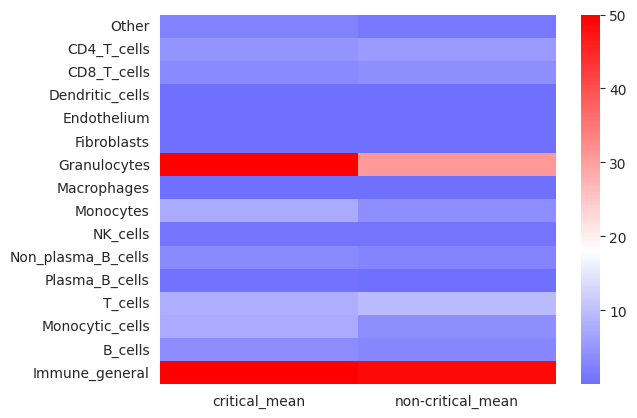

In [226]:
# Interestingly, the predicted cell population proportions
# are relatively similar to those reported in the original article:
# Less CD8 and CD4 T cells in Critical
# More granulocytes and monocytes in Critical - in agreement with higher inflammation

sns.heatmap(
    mean_populations,
    vmax=50,
    center=18,
    cmap='bwr'
)

In [304]:
granulo = pd.DataFrame(mean_populations.loc["Granulocytes", :])
lympho = pd.DataFrame({"Lymphocytes": mean_populations.loc[["T_cells", "B_cells"], :].sum()})

ratio_df = pd.concat([granulo, lympho], axis=1)
ratio_df["ratio"] = ratio_df["Granulocytes"]/ratio_df["Lymphocytes"]

In [305]:
ratio_df

,Granulocytes,Lymphocytes,ratio
critical_mean,77.551794,11.578469,6.697932
non-critical_mean,31.009013,12.616287,2.457856


## Conclusion

- Raw data from the GSE172114 dataset were processed nominally, the quality is normal, alignment went well with a mean of about 30M reads per sample
- Differential gene expression analysis showed 1111 changed genes with a strict cutoff of log2FC > 1 and adjusted P value of less than 0.05. Among the top transcripts up-regulated in the COVID-19 critical patients are some immunity related genes. Notably CD177 and MCEMP1 expressed on neutrophils, mast cells (MCEMP1), and monocytes.
- Gene set enrichment analysis corroborated these findings and displayed enrichment in inflammatory pathways such as neutrophil degranulation, interferon response, TNF alpha, STAT1 and STAT2 signalling correlating with the critical disease state.
- Weighted Gene Network Correlation analysis suggested 13 regulatory modules of genes correlating with COVID-19 status, although further pathway analysis did not bring any clearly conclusive findings and may need further investigation
- HLA-II genes haplotype analysis was carried out to complement the knowledge about the patients' immune status.
- Deconvolution analysis allowed to study the proportions of cells in peripheral blood of the patients. Congruent with the previous results, critical COVID-19 patients showed lymphopenia amidst strong evaluation of granulocyte level. Interestingly, we found a higher granulocyte/lymphocyte ratio in the critical patients, complementary to recent research showing a correlation of neutrophil to lymphocyte ratio with the disease severity. Neutrophils may make up to 70% of white blood cells, so granulocyte measure may be a good approximation.

To conclude, the patients with the critical form of COVID-19 display more intensive inflammatory processes in peripheral blood, which may be largely attributed to the activity of neutrophils, but also increased presence of monocytes and active inflammatory signaling. Further investigation of HLA-II haplotypes using multiple logistic regression, as well as deeper analysis of WGCNA results may shed light on more details differentiating critical from non-critical COVID-19 patients.